# TRABALHO: ANÁLISE MULTIVARIADA E APRENDIZADO NÃO SUPERVISIONADO
---

- Nome: Emerson Hideki Miady
- Número USP: 11207943

**Tarefa:** aplicar 2 técnicas vistas em aula em algum dataset público.

Neste trabalho foi usado um dataset do *Kaggle* para classificar se as pessoas iriam ter câncer de mama benigno ou maligno.

# CONTEXTO
---

O câncer de mama é o câncer mais comum entre as mulheres no mundo. É responsável por 25% de todos os casos de câncer e afetou mais de 2,1 milhões de pessoas somente em 2015. Começa quando as células da mama começam a crescer fora de controle. Essas células geralmente formam tumores que podem ser vistos por raios-X ou sentidos como caroços na área da mama.

Os principais desafios contra sua detecção é como classificar os tumores em malignos (cancerígenos) ou benignos (não cancerígenos). Para isso, utilizarei um dataset de câncer de mama de Wisconsin.

# IMPORTS
---

In [1]:
# Bibliotecas
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import plotly.express as px
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_validate
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.linear_model import LogisticRegression
from sklearn import metrics as m
from sklearn.model_selection import train_test_split

plt.style.use('ggplot')

In [2]:
# Dataset
df = pd.read_csv('data/breast-cancer.csv')
df.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [3]:
# Funções
def plot_variance(pca, width=8, dpi=100):
    '''
    Esta função plota os gráficos de variância explicada e acumulada.
    
    Retorna uma visualização.
    '''
    # Create figure
    fig, axs = plt.subplots(1, 2)
    n = pca.n_components_
    grid = np.arange(1, n + 1)
    # Variância Explicada
    evr = pca.explained_variance_ratio_
    axs[0].bar(grid, evr)
    axs[0].set(
        xlabel="Componente", title="% Variância Explicada", ylim=(0.0, 1.0)
    )
    # Variância Acumulada
    cv = np.cumsum(evr)
    axs[1].plot(np.r_[0, grid], np.r_[0, cv], "o-")
    axs[1].set(
        xlabel="Componente", title="% Variância Acumulada", ylim=(0.0, 1.0)
    )
    # Set up figure
    fig.set(figwidth=8, dpi=100)
    return axs

def get_cv_model_stats(model, X, y, n_splits, scoring):
    '''
    Esta função faz o cross-validation e separa os resultados do "scoring".

    O retorno é a média e o desvio padrão dos scores.
    '''
    np.random.seed(42)
    cv = KFold(n_splits=n_splits)
    results = cross_validate(model, X, y, cv=cv, scoring=scoring)

    score_mean = np.mean(results['test_score'])
    score_std = np.std(results['test_score'])

    return score_mean, score_std
     

def show_ml_metrics_results(models, X, y, n_splits, scoring):
    '''
    Esta função pega os valores da média e desvio padrão dos scores de 
    determinada métrica (scoring) e coloca a média junto do intervalo de
    confiança em um DataFrame.

    O retorno é o display deste DataFrame.
    '''
    str_models = []
    models_score_mean = []
    models_score_ci_min = []
    models_score_ci_max = []
    ml_stats_df = pd.DataFrame(columns=['Model', 'CI min', 
                                      'Final score (mean)', 'CI max'])

    for model in models:
        score_mean, score_std = get_cv_model_stats(model, X, y, 
                                                   n_splits, scoring)
        ci_min = score_mean - 2 * score_std
        ci_max = score_mean + 2 * score_std

        models_score_mean.append(score_mean)
        models_score_ci_min.append(ci_min)
        models_score_ci_max.append(ci_max)

    ml_stats_df['CI min'] = models_score_ci_min
    ml_stats_df['Final score (mean)'] = models_score_mean
    ml_stats_df['CI max'] = models_score_ci_max

    for model in models:
        word = []
        for letter in str(model):
            if letter != '(':
                word.append(letter)
            else:
                break
        word = ''.join(word)
        str_models.append(word)

    ml_stats_df['Model'] = str_models
    ml_stats_df.set_index('Model', inplace=True)
    ml_stats_df = ml_stats_df.sort_values('Final score (mean)', 
                                        ascending=False)
    ml_stats_df = ml_stats_df.style\
                  .set_table_attributes("class='dataframe'")\
                  .background_gradient(cmap='Blues', axis=0)

    print(f'Score selected: {scoring}')
    display(ml_stats_df)

# DESCRIÇÃO DOS DADOS
---

## Descrição das variáveis

- ``id``: ID da pessoa.
- ``diagnosis``: diagnóstico de câncer (variável *target*).
    - M: Maligno;
    - B: Benigno.
- Dez características são computadas para os núcleos celulares analisados, com as medidas de média (``mean``), desvio padrão (``se``) e pior (``worst``):
    - ``radius``: distância do centro aos pontos de extremidade da célula.
    - ``texture``: valores em "gray-scale".
    - ``perimeter``: perímetro.
    - ``area``: área.
    - ``smoothness``: variação local nos comprimentos dos raios.
    - ``compactness``: $\frac{perímetro^2}{área} - 1$.
    - ``concavity``: gravidade das porções côncavas do contorno.
    - ``concave points``: número de porções côncavas do contorno.
    - ``symmetry``: simetria.
    - ``fractal_dimension``: $"aproximação \ da \ costa" - 1$.

Não entendi exatamente o que são todas as medidas celulares, como por exemplo: ``texture``, ``smoothness`` e ``fractal_dimension``. Algumas outras não tenho a noção de medida em que as variáveis estão usando, como acontece em ``concavity`` e ``symmetry``, além de que não sei o que significa "pior" medida de determinada variável, seria a menor? Ou a maior? Sendo assim, não consigo explicar a definição de algumas *features*, mas irei utilizar todas para a modelagem futura.

**Problema:** Existem muitas colunas que provavelmente vão estar muito correlacionadas, pois estamos pegando medidas como a média e desvio padrão e pior valor. Além disso, é de se esperar uma forte correlação em variáveis como o raio, perímetro e área, afinal, todas utilizam o raio como base para cada conta.

**Solução:** Vou utilizar a **PCA** para diminuir o número de variáveis, e assim, diminuir a multicolinearidade.

## Dimensão dos dados

In [4]:
print(f'Existem {df.shape[0]} linhas no DataFrame.')
print(f'Existem {df.shape[1]} colunas no DataFrame.')

Existem 569 linhas no DataFrame.
Existem 32 colunas no DataFrame.


## Tipos das variáveis

In [5]:
print(df.dtypes)

id                           int64
diagnosis                   object
radius_mean                float64
texture_mean               float64
perimeter_mean             float64
area_mean                  float64
smoothness_mean            float64
compactness_mean           float64
concavity_mean             float64
concave points_mean        float64
symmetry_mean              float64
fractal_dimension_mean     float64
radius_se                  float64
texture_se                 float64
perimeter_se               float64
area_se                    float64
smoothness_se              float64
compactness_se             float64
concavity_se               float64
concave points_se          float64
symmetry_se                float64
fractal_dimension_se       float64
radius_worst               float64
texture_worst              float64
perimeter_worst            float64
area_worst                 float64
smoothness_worst           float64
compactness_worst          float64
concavity_worst     

Os tipos das variáveis são inteiro, string e float.

## Valores nulos

In [6]:
df.isna().sum()

id                         0
diagnosis                  0
radius_mean                0
texture_mean               0
perimeter_mean             0
area_mean                  0
smoothness_mean            0
compactness_mean           0
concavity_mean             0
concave points_mean        0
symmetry_mean              0
fractal_dimension_mean     0
radius_se                  0
texture_se                 0
perimeter_se               0
area_se                    0
smoothness_se              0
compactness_se             0
concavity_se               0
concave points_se          0
symmetry_se                0
fractal_dimension_se       0
radius_worst               0
texture_worst              0
perimeter_worst            0
area_worst                 0
smoothness_worst           0
compactness_worst          0
concavity_worst            0
concave points_worst       0
symmetry_worst             0
fractal_dimension_worst    0
dtype: int64

Não existem valores nulos no DataFrame, portanto nenhuma manipulação de ``NaN`` será necessário.

## Estatísticas descritivas

### Variáveis numéricas

In [7]:
# Criando as métricas do DataFrame
metrics = df.iloc[:, 2:].describe().T.drop(['count', '25%', '75%'], axis=1)
metrics.rename({'50%' : 'median'}, inplace=True, axis=1)

# Criando a skew e kurtosis
skews = df.iloc[:, 2:].apply(lambda x: x.skew()).T
kurtosis = df.iloc[:, 2:].apply(lambda x: x.kurtosis()).T

# Criando os range das variáveis
metrics['range'] = metrics['max'] - metrics['min']

# Adicionando a skew e a kurtosis no DataFrame de métricas
metrics['skew'] = skews
metrics['kurtosis'] = kurtosis

# Mudando o index
metrics.reset_index(inplace=True)
metrics.rename({'index':'attribute'}, axis=1, inplace=True)

# Mudando a ordem das colunas 
metrics = metrics[['attribute', 'min', 'max', 'range', 'mean', 'median', 
                   'std', 'skew', 'kurtosis']]
display(round(metrics, 2))

,attribute,min,max,range,mean,median,std,skew,kurtosis
0,radius_mean,6.98,28.11,21.13,14.13,13.37,3.52,0.94,0.85
1,texture_mean,9.71,39.28,29.57,19.29,18.84,4.30,0.65,0.76
2,perimeter_mean,43.79,188.50,144.71,91.97,86.24,24.30,0.99,0.97
3,area_mean,143.50,2501.00,2357.50,654.89,551.10,351.91,1.65,3.65
4,smoothness_mean,0.05,0.16,0.11,0.10,0.10,0.01,0.46,0.86
5,compactness_mean,0.02,0.35,0.33,0.10,0.09,0.05,1.19,1.65
6,concavity_mean,0.00,0.43,0.43,0.09,0.06,0.08,1.40,2.00
7,concave points_mean,0.00,0.20,0.20,0.05,0.03,0.04,1.17,1.07
8,symmetry_mean,0.11,0.30,0.20,0.18,0.18,0.03,0.73,1.29
9,fractal_dimension_mean,0.05,0.10,0.05,0.06,0.06,0.01,1.30,3.01


A *skew* e a *kurtosis* da variável ``area_se`` são as métricas mais altas em relação as outras variáveis, além de apresentar a media razoavelmente maior que a mediana e um *range* bem grande.

Vamos olhar melhor para essa variável.

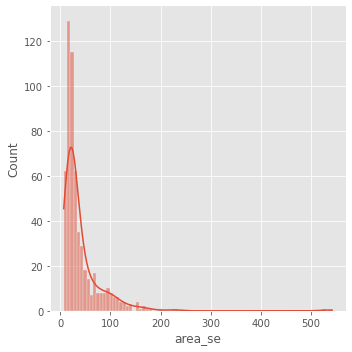

In [8]:
# Histograma e densidade da variável area_se
sns.displot(x='area_se', data=df, kde=True);

De fato, ela possui uma alta concentração dos dados próximo de 50...

**Observação:** Será necessário um *rescaling* de todas as variáveis para a PCA, por apresentar medidas bem diferentes, como acontecem com as medidas de área por exemplo.

### Variável categórica

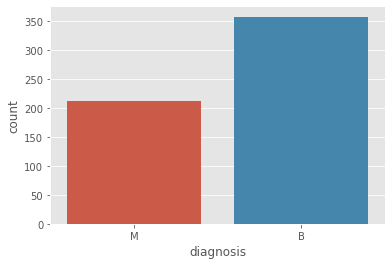

In [9]:
# Contagem da variável alvo
sns.countplot(x='diagnosis', data=df);

Os dados não parecem estar muito desbalanceados, portanto não teremos problemas com isso.

# ANÁLISE EXPLORATÓRIA (EDA)
---

Na EDA, farei as seguintes visualizações para ter uma idéia da dispersão dos dados:

1. boxplots;
2. pairplots;
3. gráficos de correlação.

## Boxplots

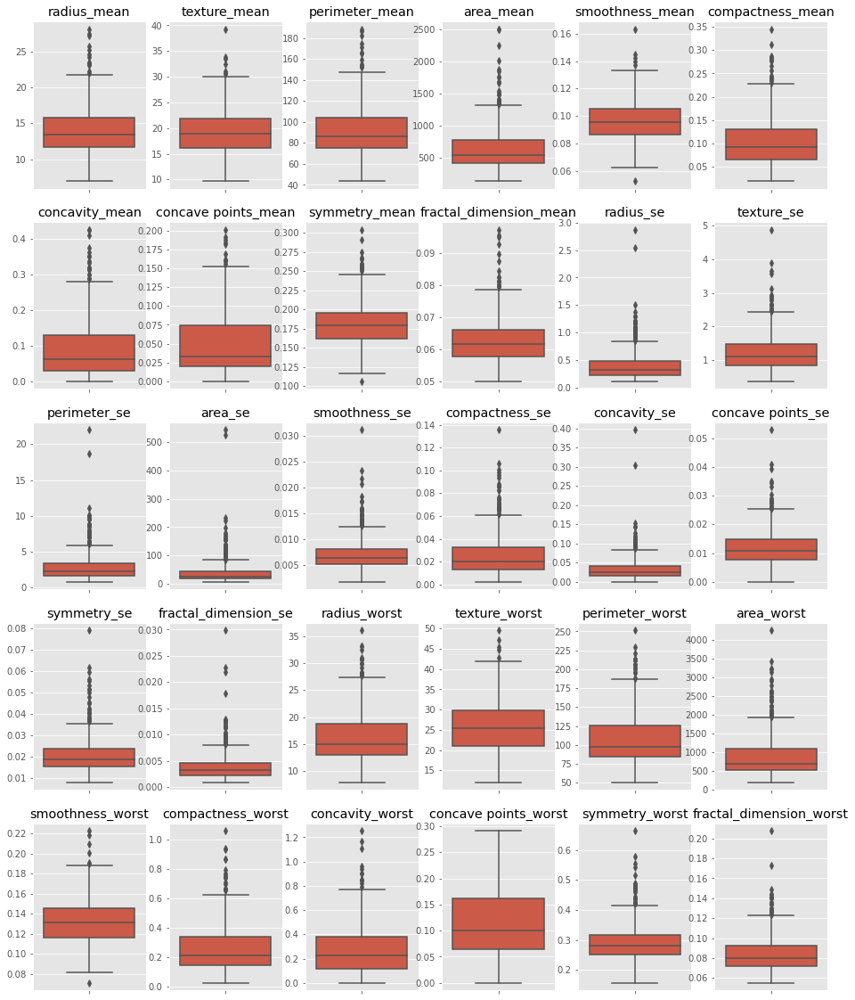

In [10]:
fig, axes = plt.subplots(5, 6)

z = 2
fig.set_size_inches(16, 20)
for i in range(5):
    for j in range(6):
        sns.boxplot(data=df.iloc[:, z], ax=axes[i, j])
        axes[i, j].set_title(df.columns[z])
        axes[i, j].set(xticklabels='')
        z += 1

De acordo com a distribuição normal e os boxplots, a única variável que não possui outliers é a ``concave_points_worst``.

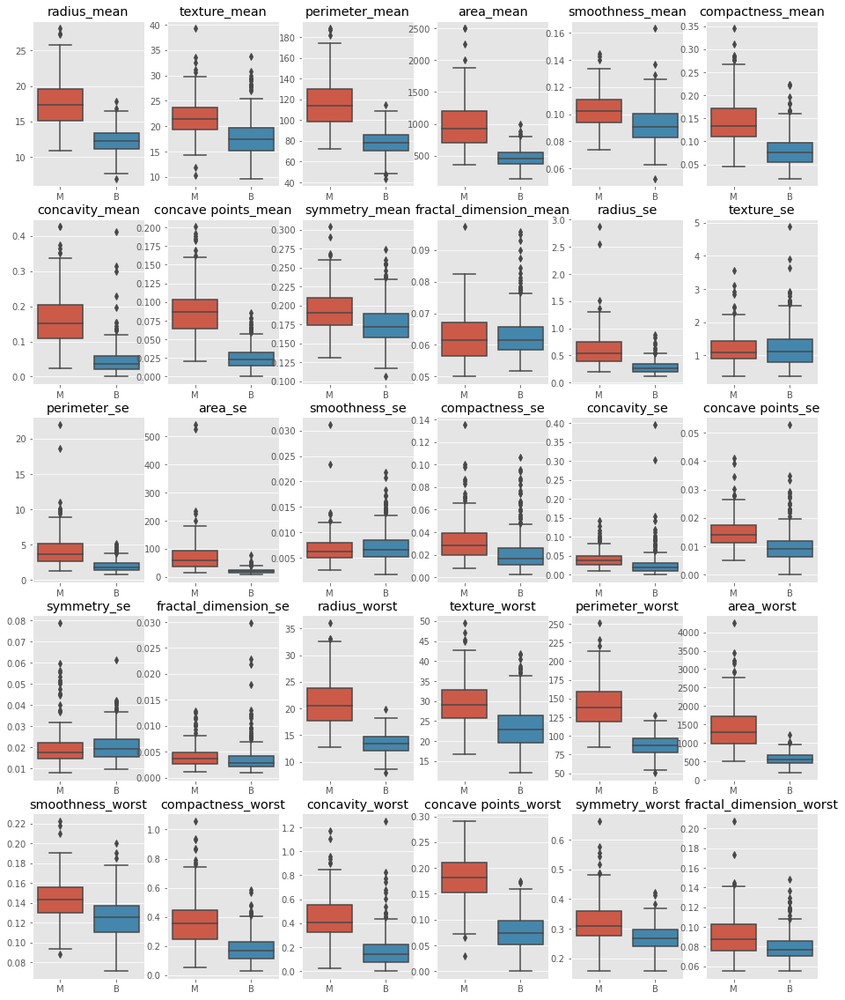

In [11]:
fig, axes = plt.subplots(5, 6)

z = 2
fig.set_size_inches(16, 20)
for i in range(5):
    for j in range(6):
        sns.boxplot(data=df, x='diagnosis', 
                    y=df.columns[z], ax=axes[i, j])
        axes[i, j].set_title(df.columns[z])
        axes[i, j].set(xlabel='')
        axes[i, j].set(ylabel='')
        z += 1

Na maior parte das variáveis, a categoria B apresenta dados que estão em uma faixa menor de valores (as caixas, ou seja, 75% dos dados estão visivelmente bem deslocadas entre as categorias).

## Pairplots

Afim de encurtar a EDA, e por apresentar muitas variáveis neste conjunto de dados, vou optar por fazer os gráficos de dispersão e histogramas somente para as médias e as piores medidas.

In [12]:
# Pegando as variáveis de média
mean_cols = [col for col in df.columns if col.endswith('mean')]
print(mean_cols)

['radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean']


In [13]:
# Pegando as variáveis de pior medida
worst_cols = [col for col in df.columns if col.endswith('worst')]
print(worst_cols)

['radius_worst', 'texture_worst', 'perimeter_worst', 'area_worst', 'smoothness_worst', 'compactness_worst', 'concavity_worst', 'concave points_worst', 'symmetry_worst', 'fractal_dimension_worst']


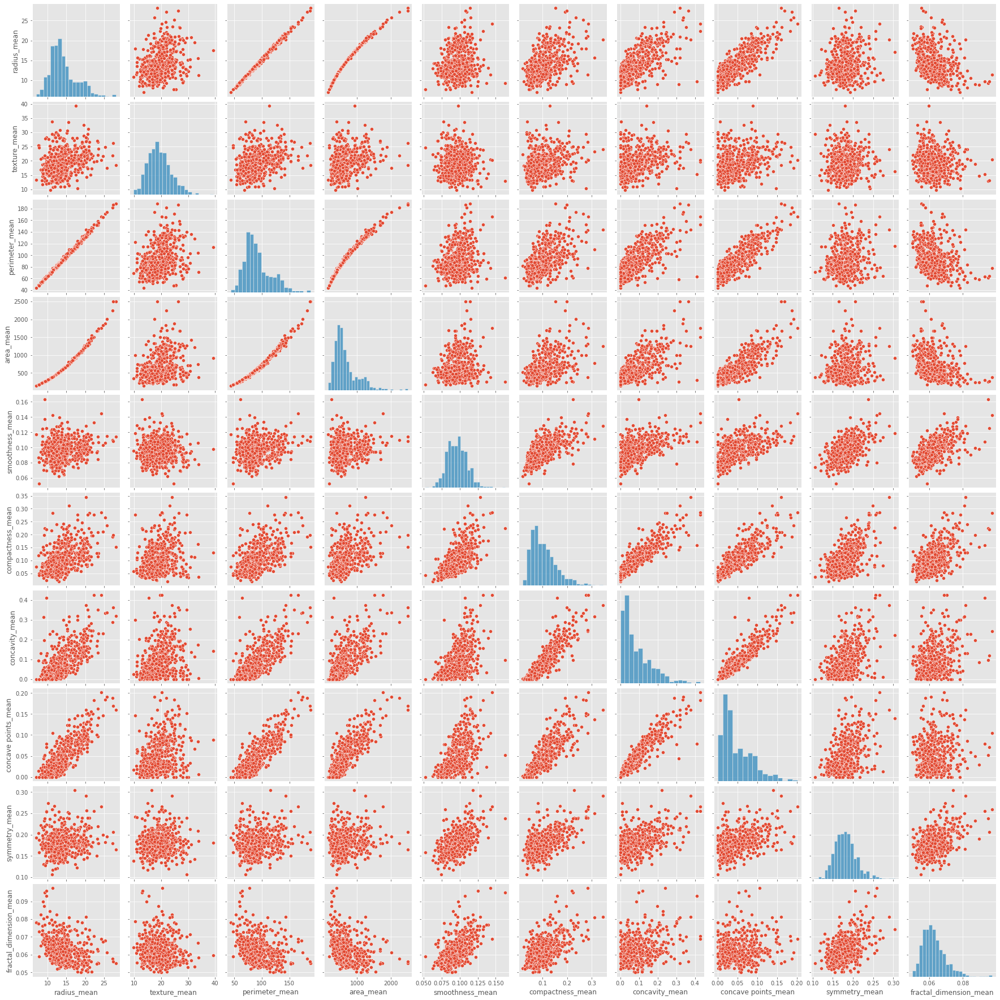

In [14]:
# Pairplot das médias
sns.pairplot(df[mean_cols]);

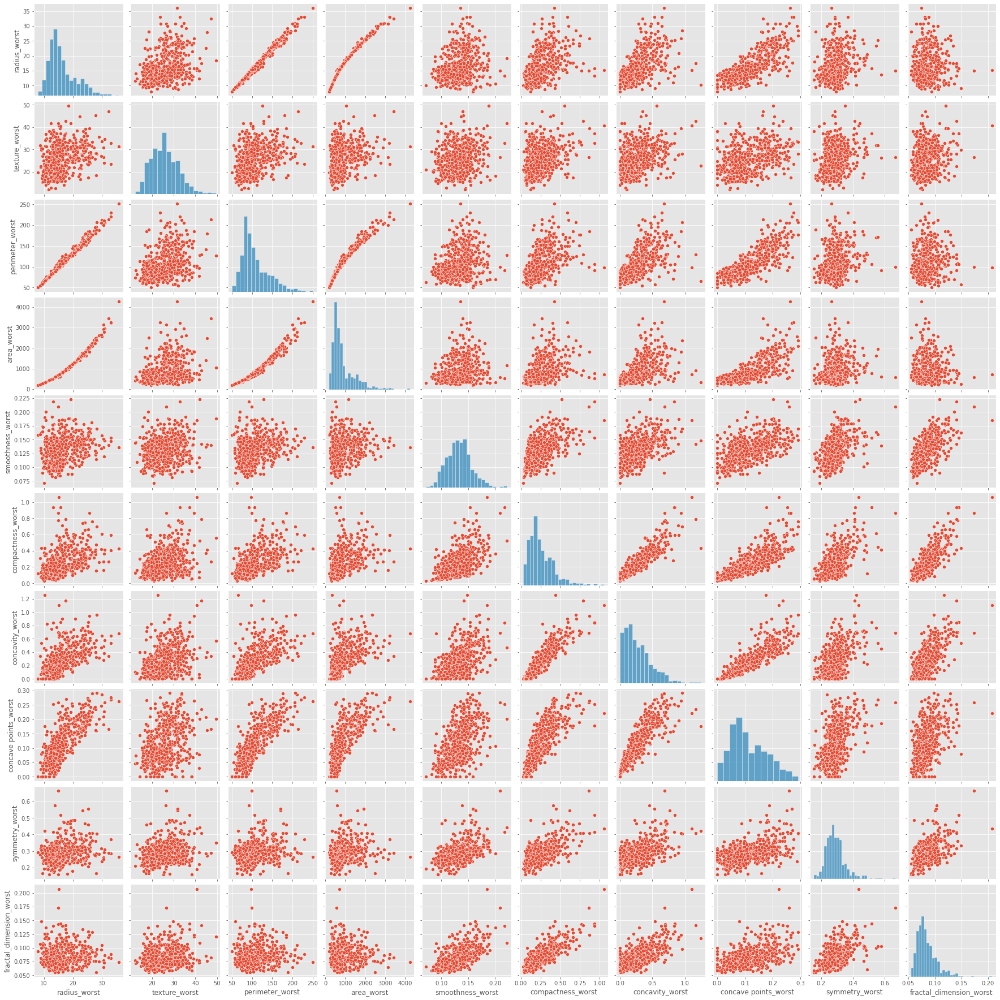

In [15]:
# Pairplot das piores medidas
sns.pairplot(df[worst_cols]);

De um modo geral, na maioria das variáveis, existe uma **tendência linear positiva**.

Vamos ver essas variáveis separadas por diagnóstico.

In [16]:
# Adicionando a variável diagnosis para ver a distinção entre grupos
mean_cols.append('diagnosis')
worst_cols.append('diagnosis')

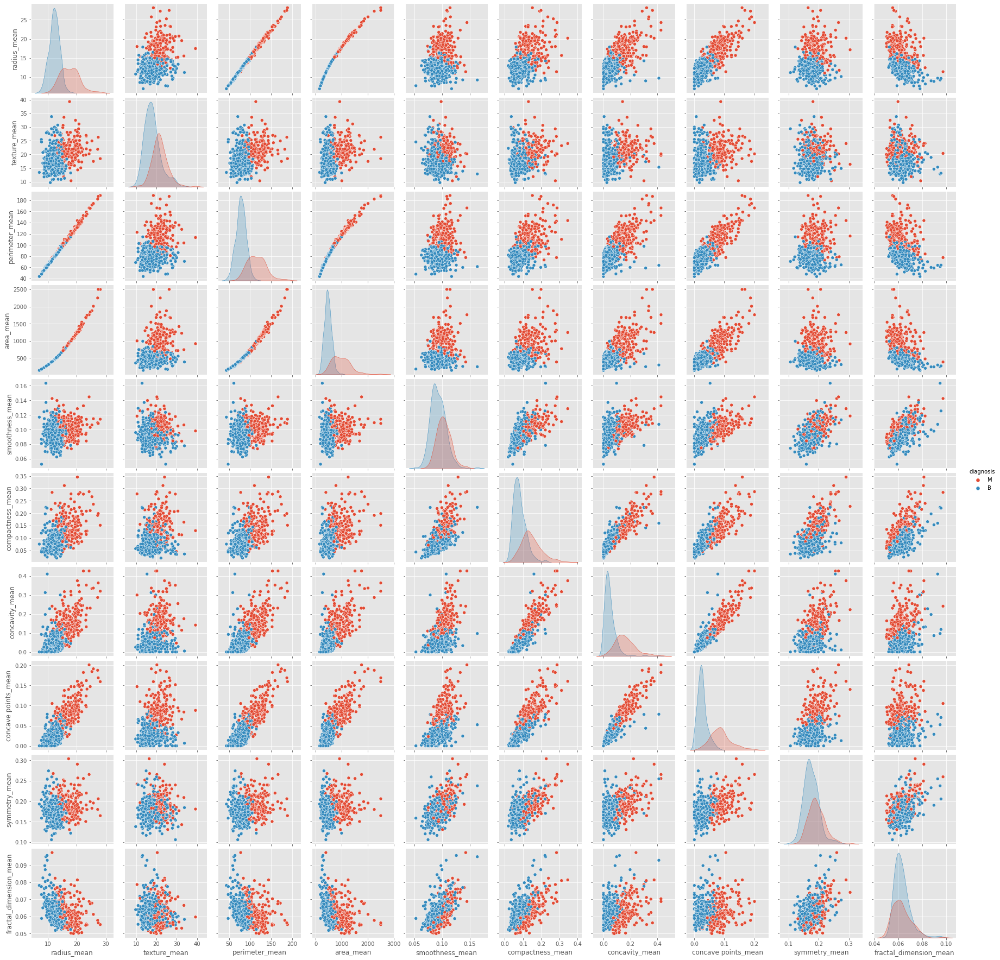

In [17]:
# Pairplot das médias separadas por grupo
sns.pairplot(df[mean_cols], hue='diagnosis');

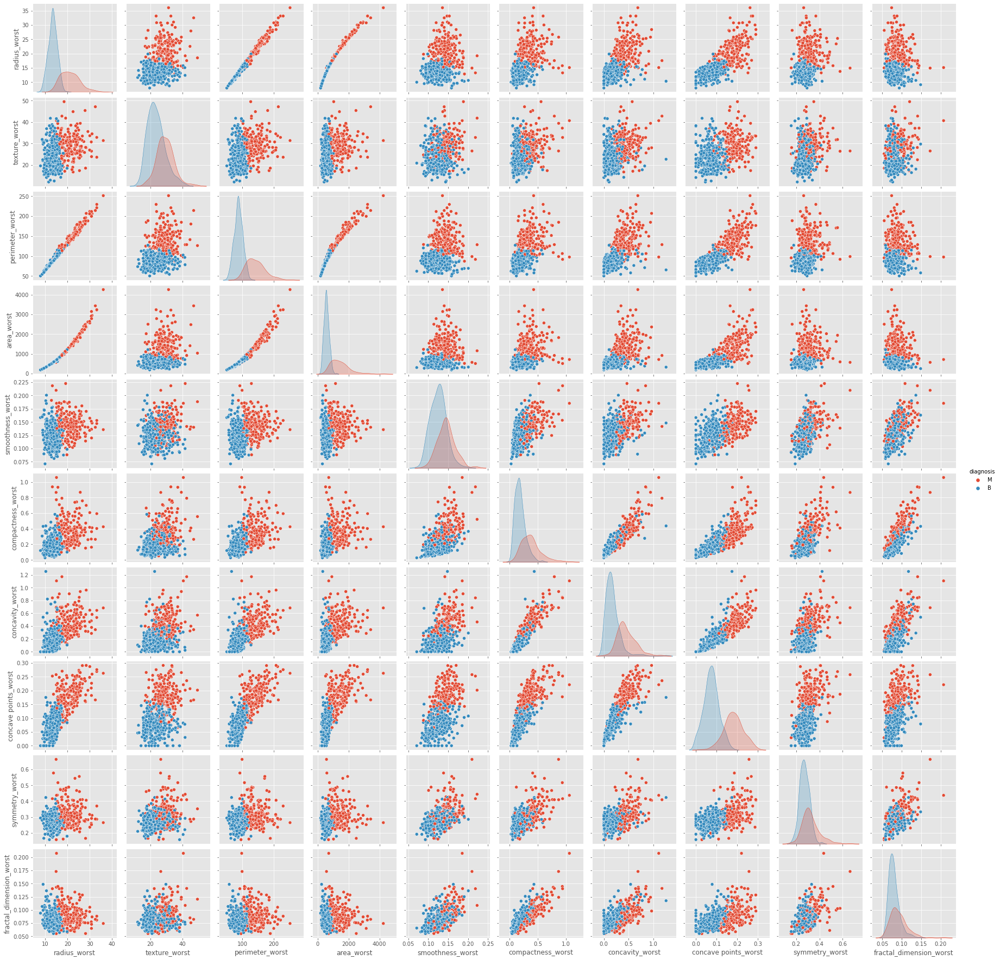

In [18]:
# Pairplot das piores medidas separadas por grupo
sns.pairplot(df[worst_cols], hue='diagnosis');

É possível ver que existem diferenças claras entre ser benigno e maligno, em quase todas as variáveis de média e pior valor!

Tanto os gráficos de dispersão quanto os histogramas entre as diferentes populações demonstram muito bem esse fato.

## Gráficos de correlação

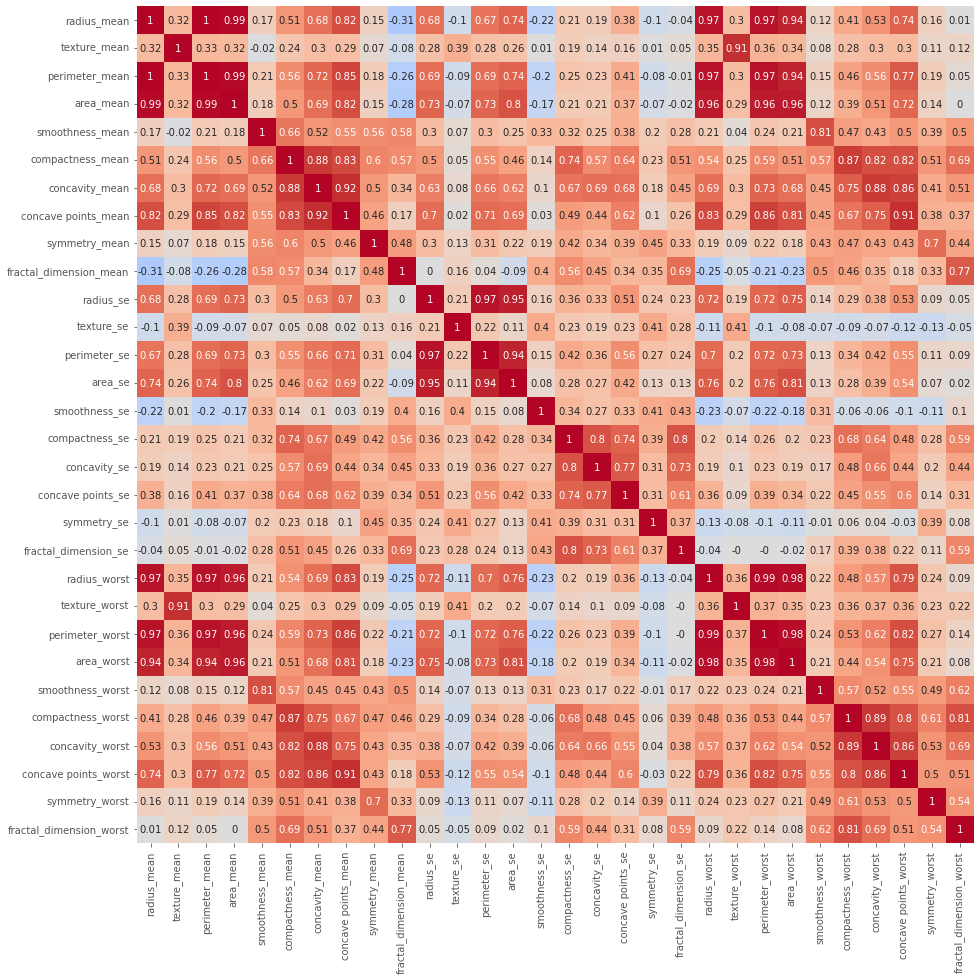

In [19]:
# Correlação entre as variáveis
corr = round(df.iloc[:, 2:].corr(), 2)

# Heatmap
plt.figure(figsize=(15.4, 15.4))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, 
            cmap='coolwarm', cbar=False, square=True);

Existem muitas variáveis altamente correlacionadas entre si... Vamos ver como ficará a redução de dimensionalidade com o PCA.

# PREPARAÇÃO PARA A MODELAGEM
---

In [20]:
# Copiando o DataFrame para esta seção e excluindo a coluna id
df_prep = df.copy()
df_prep = df_prep.iloc[:, 1:]

## Padronização dos dados

Para executar a PCA, os dados não podem estar em diversas escalas diferentes, como acontece com as medidas de área por exemplo. Sendo assim, é preciso fazer algum tipo de reescala dos dados, e a escolhida para este problema é a ``StandardScaler``.

In [21]:
# Definindo o objeto StandardScaler
scaler = StandardScaler()

# Transformando os dados
df_prep.iloc[:, 1:] = scaler.fit_transform(df_prep.iloc[:, 1:])
df_prep.head()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,M,1.097064,-2.073335,1.269934,0.984375,1.568466,3.283515,2.652874,2.532475,2.217515,...,1.886690,-1.359293,2.303601,2.001237,1.307686,2.616665,2.109526,2.296076,2.750622,1.937015
1,M,1.829821,-0.353632,1.685955,1.908708,-0.826962,-0.487072,-0.023846,0.548144,0.001392,...,1.805927,-0.369203,1.535126,1.890489,-0.375612,-0.430444,-0.146749,1.087084,-0.243890,0.281190
2,M,1.579888,0.456187,1.566503,1.558884,0.942210,1.052926,1.363478,2.037231,0.939685,...,1.511870,-0.023974,1.347475,1.456285,0.527407,1.082932,0.854974,1.955000,1.152255,0.201391
3,M,-0.768909,0.253732,-0.592687,-0.764464,3.283553,3.402909,1.915897,1.451707,2.867383,...,-0.281464,0.133984,-0.249939,-0.550021,3.394275,3.893397,1.989588,2.175786,6.046041,4.935010
4,M,1.750297,-1.151816,1.776573,1.826229,0.280372,0.539340,1.371011,1.428493,-0.009560,...,1.298575,-1.466770,1.338539,1.220724,0.220556,-0.313395,0.613179,0.729259,-0.868353,-0.397100


## Transformação binária

In [22]:
# 0 = Benigno e 1 = Maligno
df_prep['diagnosis'] = df_prep['diagnosis'].map({'B':0, 'M':1})
df_prep.head()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,1,1.097064,-2.073335,1.269934,0.984375,1.568466,3.283515,2.652874,2.532475,2.217515,...,1.886690,-1.359293,2.303601,2.001237,1.307686,2.616665,2.109526,2.296076,2.750622,1.937015
1,1,1.829821,-0.353632,1.685955,1.908708,-0.826962,-0.487072,-0.023846,0.548144,0.001392,...,1.805927,-0.369203,1.535126,1.890489,-0.375612,-0.430444,-0.146749,1.087084,-0.243890,0.281190
2,1,1.579888,0.456187,1.566503,1.558884,0.942210,1.052926,1.363478,2.037231,0.939685,...,1.511870,-0.023974,1.347475,1.456285,0.527407,1.082932,0.854974,1.955000,1.152255,0.201391
3,1,-0.768909,0.253732,-0.592687,-0.764464,3.283553,3.402909,1.915897,1.451707,2.867383,...,-0.281464,0.133984,-0.249939,-0.550021,3.394275,3.893397,1.989588,2.175786,6.046041,4.935010
4,1,1.750297,-1.151816,1.776573,1.826229,0.280372,0.539340,1.371011,1.428493,-0.009560,...,1.298575,-1.466770,1.338539,1.220724,0.220556,-0.313395,0.613179,0.729259,-0.868353,-0.397100


# Análise de Componentes Principais (PCA)
---

In [23]:
# Cópia do DataFrame para a aplicação do PCA
df_pca = df_prep.copy()

In [24]:
# Criando o objeto pca
pca = PCA()
X_pca = pca.fit_transform(df_pca.iloc[:, 1:])

# Dataframe das PCAs
component_names = [f'PC{i+1}' for i in range(X_pca.shape[1])]
X_pca = pd.DataFrame(X_pca, columns=component_names)

loadings = pd.DataFrame(
    pca.components_.T,
    columns=component_names,
    index=df_pca.iloc[:, 1:].columns,
)

display(loadings.head())

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC21,PC22,PC23,PC24,PC25,PC26,PC27,PC28,PC29,PC30
radius_mean,0.218902,-0.233857,-0.008531,0.041409,0.037786,0.018741,-0.124088,-0.007452,-0.223110,0.095486,...,-0.068570,0.072929,-0.098553,0.182579,0.019226,-0.129476,-0.131527,0.211194,0.211460,-0.702414
texture_mean,0.103725,-0.059706,0.064550,-0.603050,-0.049469,-0.032179,0.011400,0.130675,0.112699,0.240934,...,0.448369,0.094801,-0.000555,-0.098787,-0.084746,-0.024557,-0.017357,-0.000066,-0.010534,-0.000274
perimeter_mean,0.227537,-0.215181,-0.009314,0.041983,0.037375,0.017308,-0.114477,-0.018687,-0.223739,0.086386,...,-0.069769,0.075160,-0.040245,0.116649,-0.027015,-0.125256,-0.115415,0.084338,0.383826,0.689897
area_mean,0.220995,-0.231077,0.028700,0.053434,0.010331,-0.001888,-0.051653,0.034674,-0.195586,0.074956,...,-0.018443,0.097566,0.007777,-0.069848,0.210041,0.362727,0.466612,-0.272508,-0.422795,0.032947
smoothness_mean,0.142590,0.186113,-0.104292,0.159383,-0.365089,-0.286374,-0.140669,-0.288975,0.006425,-0.069293,...,-0.119492,0.063823,-0.020666,-0.068697,-0.028955,-0.037004,0.069690,0.001479,-0.003435,0.004847


In [25]:
# Variância acumulada
evr = pca.explained_variance_ratio_
cv = np.cumsum(evr)
print('Valores das variâncias acumuladas, em ordem crescente da componente:\n')
print(cv)

Valores das variâncias acumuladas, em ordem crescente da componente:

[0.44272026 0.63243208 0.72636371 0.79238506 0.84734274 0.88758796
 0.9100953  0.92598254 0.93987903 0.95156881 0.961366   0.97007138
 0.97811663 0.98335029 0.98648812 0.98915022 0.99113018 0.99288414
 0.9945334  0.99557204 0.99657114 0.99748579 0.99829715 0.99889898
 0.99941502 0.99968761 0.99991763 0.99997061 0.99999557 1.        ]


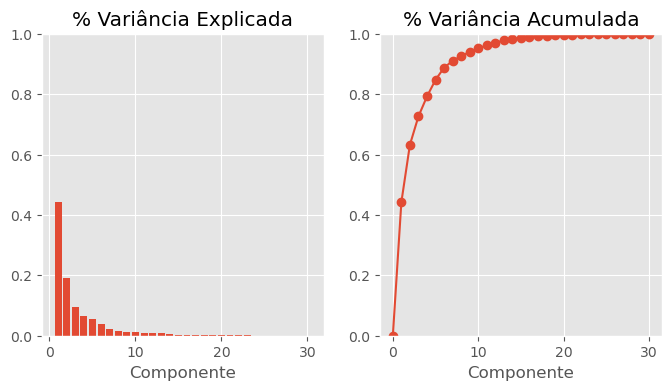

In [26]:
plot_variance(pca);

Para atingir a variância acumulada de 95%, temos que o número ideal de componentes principais é igual a **10**. Sendo assim, irei utilizar 10 variáveis para a classificação, ao invés de 30.

In [27]:
# Refazendo o procedimento porém com 10 componentes
pca = PCA(n_components=10)
X_pca = pca.fit_transform(df_pca.iloc[:, 1:])

component_names = [f'PC{i+1}' for i in range(X_pca.shape[1])]
X_pca = pd.DataFrame(X_pca, columns=component_names)

loadings = pd.DataFrame(
    pca.components_.T,
    columns=component_names,
    index=df_pca.iloc[:, 1:].columns,
)

In [28]:
display(round(loadings, 3))

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10
radius_mean,0.219,-0.234,-0.009,0.041,0.038,0.019,-0.124,-0.007,-0.223,0.095
texture_mean,0.104,-0.060,0.065,-0.603,-0.049,-0.032,0.011,0.131,0.113,0.241
perimeter_mean,0.228,-0.215,-0.009,0.042,0.037,0.017,-0.114,-0.019,-0.224,0.086
area_mean,0.221,-0.231,0.029,0.053,0.010,-0.002,-0.052,0.035,-0.196,0.075
smoothness_mean,0.143,0.186,-0.104,0.159,-0.365,-0.286,-0.141,-0.289,0.006,-0.069
compactness_mean,0.239,0.152,-0.074,0.032,0.012,-0.014,0.031,-0.151,-0.168,0.013
concavity_mean,0.258,0.060,0.003,0.019,0.086,-0.009,-0.108,-0.073,0.041,-0.136
concave points_mean,0.261,-0.035,-0.026,0.065,-0.044,-0.052,-0.150,-0.152,-0.112,0.008
symmetry_mean,0.138,0.190,-0.040,0.067,-0.306,0.356,-0.094,-0.232,0.256,0.572
fractal_dimension_mean,0.064,0.367,-0.023,0.049,-0.044,-0.119,0.296,-0.177,-0.124,0.081


Possíveis nomes para as componentes principais:

- ``PC1``: Concavidade / Pontos côncavos celular.
- ``PC2``: Dimensão fractal celular.
- ``PC3``: Desvio padrão / Piores valores de todas as medidas celulares.
- ``PC4``: Textura da célula.
- ``PC5``: Suavidade / Simetria / Desvio padrão de:
    - Concavidade;
    - Compacidade;
    - Dimensão Fractal.
- ``PC6``: Suavidade / Simetria celular.
- ``PC7``: Média e Pior dimensão fractal / Desvio padrão da(o):
    - Concavidade;
    - Raio.
- ``PC8``: Desvio padrão de:
    - Suavidade;
    - Textura.
- ``PC9``: Desvio padrão da:
    - Concavidade;
    - Simetria.
- ``PC10``: Média da simetria celular.

In [29]:
# Criando um novo DataFrame com as PC
pca_id_df = df.iloc[:, :2].join(X_pca)
display(pca_id_df)

,id,diagnosis,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10
0,842302,M,9.192837,1.948583,-1.123166,3.633731,-1.195110,1.411424,2.159370,-0.398407,-0.157112,-0.877403
1,842517,M,2.387802,-3.768172,-0.529293,1.118264,0.621775,0.028656,0.013358,0.240988,-0.711905,1.106984
2,84300903,M,5.733896,-1.075174,-0.551748,0.912083,-0.177086,0.541452,-0.668168,0.097376,0.024069,0.454281
3,84348301,M,7.122953,10.275589,-3.232790,0.152547,-2.960878,3.053422,1.429909,1.059570,-1.405438,-1.116961
4,84358402,M,3.935302,-1.948072,1.389767,2.940639,0.546747,-1.226495,-0.936212,0.636376,-0.263809,0.377711
...,...,...,...,...,...,...,...,...,...,...,...,...
564,926424,M,6.439315,-3.576817,2.459487,1.177314,-0.074824,-2.375193,-0.596131,-0.035469,0.987922,0.257007
565,926682,M,3.793382,-3.584048,2.088476,-2.506028,-0.510723,-0.246710,-0.716326,-1.113360,-0.105211,-0.108632
566,926954,M,1.256179,-1.902297,0.562731,-2.089227,1.809991,-0.534447,-0.192758,0.341885,0.393916,0.520863
567,927241,M,10.374794,1.672010,-1.877029,-2.356031,-0.033742,0.567937,0.223081,-0.280237,-0.542030,-0.089283


In [30]:
# Refazendo o procedimento porém com 2 componentes para p Biplot
pca = PCA(n_components=2)
X_pca = pca.fit_transform(df_pca.iloc[:, 1:])

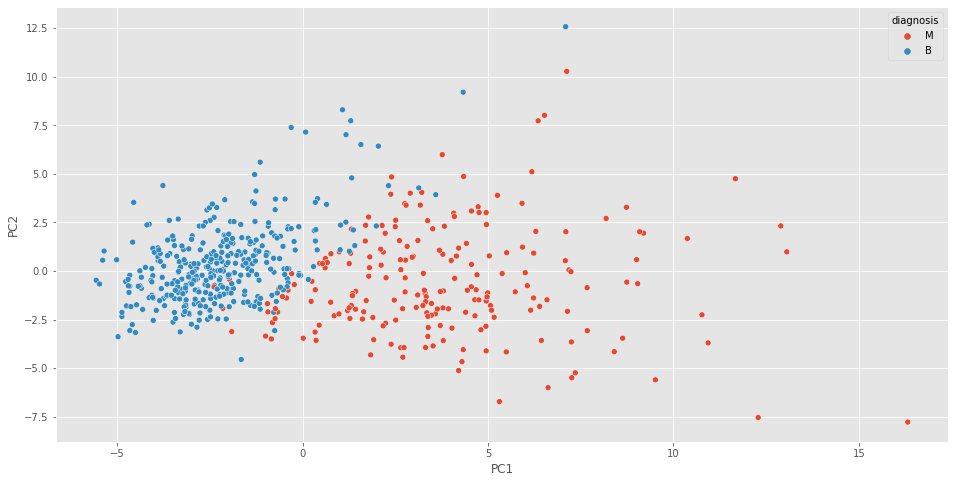

In [31]:
# Vendo a separação do diagnóstico em relação as componentes
plt.figure(figsize=(16, 8))
sns.scatterplot(x='PC1', y='PC2', data=pca_id_df, hue='diagnosis');

As 2 primeiras componentes principais (maiores variâncias explicativas) mantiveram a boa separação de diagnóstico que ocorria nas variáveis antigas, estas duas a duas. Além disso, agora temos menos variáveis para realizar a classificação!

In [32]:
# Biplot
loadings = pca.components_.T * np.sqrt(pca.explained_variance_)

fig = px.scatter(X_pca, x=0, y=1, color=pca_id_df['diagnosis'])

for i, feature in enumerate(df_pca.columns[1:]):
    fig.add_shape(
        type='line',
        x0=0, y0=0,
        x1=15*loadings[i, 0],
        y1=15*loadings[i, 1]
    )
    fig.add_annotation(
        x=15*loadings[i, 0],
        y=15*loadings[i, 1],
        ax=0, ay=0,
        xanchor="center",
        yanchor="bottom",
        text=feature
    )

fig.update_layout(
    xaxis_title="PC1",
    yaxis_title="PC2",
    legend_title="diagnosis")

fig.show()

Infelizmente o Biplot está ruim, isto por conta da quantidade de variáveis que tínhamos, as letras ficam muito aglomeradas e não conseguimos ter uma boa visualização do que está acontecendo... Mas tudo bem, seguimos adiante com o nosso novo dataframe, ``pca_id_df``.

# Machine Learning
---

Nesta etapa, quero comparar 2 modelos lineares para classificar o diagnóstico de câncer de mama:

- Análise discriminante linear de Fisher;
- Regressão Logística.

Para avaliar os algoritmos, vou aplicar um *cross validation* e optar pelas médias das melhores métricas de:

- $Accuracy = \frac{TP+TN}{TP+TN+FP+FN}$;
- $Precision = \frac{TP}{TP+FP}$;
- $Recall = \frac{TP}{TP+FN}$;
- $F1 \ Score = 2 * \frac{Precision * Recall}{Precision + Recall}$;
- $AUC$.

**Observação 1:** TP = True Positive; TN = True Negative; FP = False Positive; FN = False Negative.

**Observação 2:** Para o *cross validation*, será usado um k = 5 para os folds.

In [33]:
# Definindo as variáveis dependente e independentes
X = pca_id_df.iloc[:, 2:]
y = pca_id_df['diagnosis'].map({'B':0, 'M':1})

# Treino e teste
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, 
                                                    random_state=42)

In [34]:
# Definindo os modelos
lda = LinearDiscriminantAnalysis()
lr = LogisticRegression()

In [35]:
models = [lda, lr]
metrics = ['accuracy', 'precision', 'recall', 'roc_auc', 'f1']

for metric in metrics:
    show_ml_metrics_results(models, X, y, 5, metric)
    print('\n')

Score selected: accuracy


,CI min,Final score (mean),CI max
Model,,,
LogisticRegression,0.937918,0.971899,1.005879
LinearDiscriminantAnalysis,0.866604,0.947322,1.028039




Score selected: precision


,CI min,Final score (mean),CI max
Model,,,
LinearDiscriminantAnalysis,0.956814,0.988429,1.020044
LogisticRegression,0.906650,0.968266,1.029881




Score selected: recall


,CI min,Final score (mean),CI max
Model,,,
LogisticRegression,0.866976,0.956687,1.046397
LinearDiscriminantAnalysis,0.772730,0.886830,1.000931




Score selected: roc_auc


,CI min,Final score (mean),CI max
Model,,,
LogisticRegression,0.986723,0.995430,1.004137
LinearDiscriminantAnalysis,0.971879,0.990478,1.009077




Score selected: f1


,CI min,Final score (mean),CI max
Model,,,
LogisticRegression,0.923286,0.961233,0.999180
LinearDiscriminantAnalysis,0.868715,0.933842,0.998969


O melhor modelo no *cross validation* foi a **Regressão Logística**, pois ela apresentou, majoritariamente, as melhores métricas de avaliação em média! Portanto, este será o modelo final para a previsão do diagnóstico.

Vamos treinar agora o modelo com todos o conjunto de dados de treino, e realizar uma avaliação final com os dados de teste.

In [36]:
# Redefinindo o modelo logístico
lr = LogisticRegression()

# Treino do modelo
lr.fit(X_train, y_train)

# Predição do teste
y_pred = lr.predict(X_test)

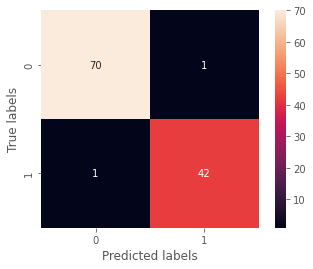

In [37]:
cm = m.confusion_matrix(y_test, y_pred)

sns.heatmap(cm, annot=True, fmt='g', square=True);
plt.xlabel('Predicted labels');
plt.ylabel('True labels'); 

A Regressão Logística apresenta resultados muito bons no treinamento.

In [38]:
# Métricas
accuracy = (cm[0, 0] + cm[1, 1]) / len(y_pred) 
precision = cm[1, 1] / (cm[1, 1] + cm[0, 1])
recall = cm[1, 1] / (cm[1, 1] + cm[1, 0])
f1 = 2 * precision * recall / (precision + recall)
aper = 1 - accuracy

# DataFrame de métricas
final_metrics_df = pd.DataFrame(columns=['Metrics', 'Values'])
final_metrics_df['Metrics'] = ['accuracy', 'precision', 
                               'recall', 'f1', 'aper']
final_metrics_df['Values'] = [accuracy, precision, recall, f1, aper]
display(round(final_metrics_df, 4))

,Metrics,Values
0,accuracy,0.9825
1,precision,0.9767
2,recall,0.9767
3,f1,0.9767
4,aper,0.0175


# CONCLUSÃO
---

De 30 variáveis explicativas, reduzimos com o PCA para um total de 10 componentes. Essas variáveis, na maior parte do caso, possuíam correlações altas entre si, o que poderia causar uma multicolinearidade na hora do ajuste dos modelos, então essa redução foi muito eficiente.

Em seguida, foi aplicado a Análise de Discriminante de Fisher e a Regressão Logística, e para a comparação, utilizei as métricas *accuracy*, *precision*, *recall*, *f1-score* e *AUC* em um *cross-validation* com 5 folds. O melhor modelo foi a Regressão Logística, por apresentar o maior valor na maioria das métricas (menos *recall*).

Para finalizar, rodei um teste final com o conjunto de treino e teste inteiros, e obtive as métricas *accuracy*, *precision*, *recall*, *f1-score* e *aper* (erro aparente), e todas elas deram resultados muito bons!

Finalizamos aqui o trabalho desta matéria, com um DataFrame de 12 variáveis (10 + id + diagnóstico) e o melhor modelo sendo a Regressão Logística.